<a href="https://colab.research.google.com/github/majavarsava/ObradaPrirodnogJezika-LV/blob/main/LV5_End_to_end_speech_to_text_(bez_rjesenja).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Lab 5: End-to-End Speech-to-Text Summarization / Topic Modeling (ipynb)



In [1]:
!pip install SpeechRecognition
!pip install pydub
!pip install ffmpeg-python
!pip install nltk
!pip install scikit-learn
!pip install matplotlib
!pip install openai-whisper






   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 32.9/32.9 MB 15.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 803.2/803.2 kB 15.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 170.5/170.5 MB 7.6 MB/s eta 0:00:00
  Created wheel for openai-whisper: filename=openai_whisper-20250625-py3-none-any.whl size=803979 sha256=2656c15f914baca7a4337fe068740e3e6a5843aab565a48a9af96fbee3950f62
  Stored in directory: /root/.cache/pip/wheels/61/d2/20/09ec9bef734d126cba375b15898010b6cc28578d8afdde5869
Successfully built openai-whisper


In [2]:
import os
from pathlib import Path
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import speech_recognition as sr
import whisper
import re

from IPython.display import Audio
from pydub import AudioSegment
from pathlib import Path
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.metrics.pairwise import cosine_similarity


/usr/local/lib/python3.12/dist-packages/pydub/utils.py:300: SyntaxWarning: invalid escape sequence '\('
  m = re.match('([su]([0-9]{1,2})p?) \(([0-9]{1,2}) bit\)$', token)
/usr/local/lib/python3.12/dist-packages/pydub/utils.py:301: SyntaxWarning: invalid escape sequence '\('
  m2 = re.match('([su]([0-9]{1,2})p?)( \(default\))?$', token)
/usr/local/lib/python3.12/dist-packages/pydub/utils.py:310: SyntaxWarning: invalid escape sequence '\('
  elif re.match('(flt)p?( \(default\))?$', token):
/usr/local/lib/python3.12/dist-packages/pydub/utils.py:314: SyntaxWarning: invalid escape sequence '\('
  elif re.match('(dbl)p?( \(default\))?$', token):


## 1) Što je ASR (Automatic Speech Recognition)

Automatic Speech Recognition (ASR) predstavlja skup metoda i algoritama za automatsku pretvorbu govornog signala u pisani tekst. U okviru ovog laboratorijskog zadatka ASR čini ulaznu komponentu end-to-end sustava, u kojem se govorni signal postupno transformira u strukturirani tekstualni uvid, poput sažetka ili skupa tematskih pojmova.

Kvaliteta izlaza ASR-a izravno utječe na uspješnost svih kasnijih faza obrade, uključujući normalizaciju teksta, ekstraktivno sažimanje i topic modeling. Pogreške nastale u fazi prepoznavanja govora često se prenose kroz cijeli sustav, što naglašava važnost razumijevanja ograničenja i karakteristika ASR tehnologije.


##ASR sustav tipično prolazi kroz ova tri sloja:

**1. Ekstrakcija značajki iz audio signala**

Govorni signal se pretvara u numeričku reprezentaciju koja opisuje relevantne akustičke karakteristike. Najčešće se koriste Mel-frekvencijski koeficijenti ili Mel-spektrogrami, koji približavaju način na koji ljudsko uho percipira zvuk.

**2. Modeliranje odnosa između zvuka i jezika**

Na temelju izlučenih značajki, model uči mapiranje između akustičkog signala i sekvence znakova ili riječi. Ova faza čini jezgru ASR sustava.

**3. Dekodiranje i generiranje teksta**

U završnoj fazi odabire se najvjerojatnija sekvenca riječi, često uz implicitnu ili eksplicitnu uporabu jezičnog modela koji osigurava gramatičku i semantičku koherentnost izlaznog teksta.



### 1.1 Primjer: učitavanje audio datoteke

Audiozapis je potrebno staviti u trenutni direktorij, npr. ako koristite Google Colab `sample_data/audio.mp3`.


In [3]:
DATA_DIR = Path("data")
DATA_DIR.mkdir(exist_ok=True)

AUDIO_PATH = Path("sample_data/audio.mp3")

print("Putanja:", AUDIO_PATH.resolve())
print("Postoji?", AUDIO_PATH.exists())

Audio(filename=str(AUDIO_PATH))


Putanja: /content/sample_data/audio.mp3
Postoji? False


FileNotFoundError: [Errno 2] No such file or directory: 'sample_data/audio.mp3'

### 1.2 Transkripcija s SpeechRecognition

Biblioteka SpeechRecognition omogućuje jednostavno korištenje različitih sustava za automatsko prepoznavanje govora putem jedinstvenog Python sučelja. Sama biblioteka ne implementira vlastiti ASR model, već služi kao posrednik prema vanjskim servisima, među kojima se najčešće koristi Google Web Speech API.

Proces prepoznavanja govora sastoji se od učitavanja audio zapisa, slanja audio podataka odabranom ASR servisu te povrata sirovog tekstualnog transkripta. Dobiveni transkript ne sadrži dodatnu normalizaciju niti pouzdanu segmentaciju rečenica.

Prednost ovog pristupa je brza i jednostavna primjena uz relativno dobru kvalitetu transkripcije za kraće i jasne audio zapise. Glavna ograničenja uključuju ovisnost o internetskoj vezi, ograničenu kontrolu nad procesom prepoznavanja te moguća ograničenja u duljini audio zapisa.

U ovom laboratorijskom radu SpeechRecognition se koristi kao alternativno online ASR rješenje, s ciljem ilustriranja razlika između online i offline pristupa prepoznavanju govora.

In [4]:
r = sr.Recognizer()

audio_file_path = Path(AUDIO_PATH)

if audio_file_path.suffix.lower() == ".mp3":
    print("Converting MP3 to WAV...")
    audio = AudioSegment.from_mp3(audio_file_path)
    wav_path = audio_file_path.with_suffix(".wav")
    audio.export(wav_path, format="wav")
    audio_file_path = wav_path
    print(f"Converted to {wav_path}")

with sr.AudioFile(str(audio_file_path)) as source:
    audio_data = r.record(source)

transcript = r.recognize_google(audio_data, language="en-US")
print(transcript)

Converting MP3 to WAV...


FileNotFoundError: [Errno 2] No such file or directory: 'sample_data/audio.mp3'

### 1.3 Whisper

Whisper je sustav za automatsko prepoznavanje govora razvijen od strane organizacije OpenAI, temeljen na end-to-end neuronskoj arhitekturi. Sustav koristi duboke neuronske mreže temeljene na Transformer modelima za izravno preslikavanje audio signala u tekstualni zapis, bez potrebe za eksplicitnim fonetskim pravilima ili zasebnim jezičnim modelima.

Whisper je treniran na velikoj količini višekanalnih i višejezičnih audio podataka, što mu omogućuje visoku robusnost na šum, različite naglaske i spontane govorne obrasce. Osim samog transkripta, model generira i vremenski segmentirane dijelove teksta, koji približno odgovaraju prirodnim pauzama u govoru.

U ovom laboratorijskom radu Whisper se koristi kao offline ASR rješenje, čime se izbjegava ovisnost o internetskoj vezi i vanjskim servisima. Dobiveni segmenti transkripta iskorišteni su kao ulazne jedinice za ekstraktivno sažimanje pomoću TextRank algoritma, čime se osigurava prirodnija i semantički smislenija segmentacija teksta.

In [5]:
model = whisper.load_model("base")
result = model.transcribe(str(AUDIO_PATH), fp16=False)

sentences = [seg["text"].strip() for seg in result["segments"] if seg["text"].strip()]

print("Broj rečenica:", len(sentences))
for i, s in enumerate(sentences, 1):
    print(f"{i}. {s}")



100%|████████████████████████████████████████| 139M/139M [00:00<00:00, 148MiB/s]


RuntimeError: Failed to load audio: ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-libzimg --enable-libzmq --enable-libzvbi --enable-lv2 --enable-omx --enable-openal --enable-opencl --enable-opengl --enable-sdl2 --enable-pocketsphinx --enable-librsvg --enable-libmfx --enable-libdc1394 --enable-libdrm --enable-libiec61883 --enable-chromaprint --enable-frei0r --enable-libx264 --enable-shared
  libavutil      56. 70.100 / 56. 70.100
  libavcodec     58.134.100 / 58.134.100
  libavformat    58. 76.100 / 58. 76.100
  libavdevice    58. 13.100 / 58. 13.100
  libavfilter     7.110.100 /  7.110.100
  libswscale      5.  9.100 /  5.  9.100
  libswresample   3.  9.100 /  3.  9.100
  libpostproc    55.  9.100 / 55.  9.100
sample_data/audio.mp3: No such file or directory


U ovom koraku koristi se Whisper ASR model za automatsku transkripciju audio zapisa.
Osim teksta, model generira i vremenski segmentirane dijelove transkripta, koji se
koriste kao ulazne jedinice za daljnju obradu.

Dobiveni segmenti približno odgovaraju prirodnim pauzama u govoru te su prikladni
za primjenu ekstraktivnih metoda sažimanja.


## 2) Normalizacija i predobrada teksta

Normalizacija i predobrada teksta predstavlja skup postupaka kojima se sirovi transkript prilagođava za daljnju računalnu obradu. Budući da je govor po prirodi spontan, a ASR izlaz često bez interpunkcije i s kolokvijalnim obrascima, transkript se najprije mora strukturirati i očistiti kako bi metode sažimanja i topic modelinga dale stabilne i interpretabilne rezultate.

Predobrada u ovom radu obuhvaća:
(1) osnovno čišćenje i standardizaciju teksta,
(2) uklanjanje dijelova niske informacijske vrijednosti (npr. promotivni sadržaj i URL-ovi),
(3) segmentaciju teksta na rečenice te
(4) pripremu tokena (npr. uklanjanje stop-riječi) ovisno o potrebama pojedine metode.

### 2.1 Osnovna normalizacija


In [6]:
def basic_normalize(text: str) -> str:
    text = text.strip()
    text = text.replace("\n", " ")
    text = re.sub(r"\s+", " ", text)
    text = text.lower()
    return text

norm_text = basic_normalize(transcript)
print(norm_text)


NameError: name 'transcript' is not defined

In [ ]:
def remove_promotional_tail(text: str) -> str:
    text = re.sub(r"\bto learn more\b.*$", "", text).strip()
    return text

clean_text = remove_promotional_tail(norm_text)
print(clean_text)


what is ai ai stands for artificial intelligence and it's a way for computers to learn and work kind of like us you can think of ai as a brain for a computer similar to how we use our brains to learn and make decisions ai uses special computer programs to do the same thing with ai computers can help us with the stuff that would be really hard for people to do on their own they can help doctors diagnose diseases allow us to predict the weather more accurately and even play video games it works by using software to look at lots of information and find patterns just like how you can tell the difference between a dog and a cat ai can learn to recognize things too there are three main types of ai supervised and reinforcement learning each type of data to get better at what they do ai is important because it helps us do things faster more accurately and sometimes it can help us solve really complex problems that we might not be able to figure out by ourselves with ai the possibilities are en

In [ ]:
def sentences_from_text(text, words_per_sentence=20):
    words = text.split()
    sentences = []
    for i in range(0, len(words), words_per_sentence):
        chunk = words[i:i + words_per_sentence]
        if len(chunk) >= 8:
            sentences.append(" ".join(chunk))
    return sentences

sentences = sentences_from_text(clean_text)

for i, s in enumerate(sentences, 1):
    print(f"{i}. {s}")


1. what is ai ai stands for artificial intelligence and it's a way for computers to learn and work kind of
2. like us you can think of ai as a brain for a computer similar to how we use our brains
3. to learn and make decisions ai uses special computer programs to do the same thing with ai computers can help
4. us with the stuff that would be really hard for people to do on their own they can help doctors
5. diagnose diseases allow us to predict the weather more accurately and even play video games it works by using software
6. to look at lots of information and find patterns just like how you can tell the difference between a dog
7. and a cat ai can learn to recognize things too there are three main types of ai supervised and reinforcement
8. learning each type of data to get better at what they do ai is important because it helps us do
9. things faster more accurately and sometimes it can help us solve really complex problems that we might not be able
10. to figure out by ourselves w

### 2.1 Tokenizacija
Tokenizacija je postupak razlaganja teksta na osnovne jezične jedinice – tokene, najčešće riječi. Tokenizacija omogućuje individualnu obradu riječi i predstavlja temeljni korak u gotovo svim NLP algoritmima.

U ovom radu koristi se jednostavna tokenizacija temeljena na pravilima, uz uklanjanje interpunkcijskih znakova i standardizaciju slova.

In [ ]:
def tokenize(text: str):
    text = text.lower()
    text = re.sub(r"[^a-z\s]", " ", text)
    text = re.sub(r"\s+", " ", text).strip()
    tokens = text.split()
    return tokens

tokens = tokenize(clean_text)
print(tokens)



['what', 'is', 'ai', 'ai', 'stands', 'for', 'artificial', 'intelligence', 'and', 'it', 's', 'a', 'way', 'for', 'computers', 'to', 'learn', 'and', 'work', 'kind', 'of', 'like', 'us', 'you', 'can', 'think', 'of', 'ai', 'as', 'a', 'brain', 'for', 'a', 'computer', 'similar', 'to', 'how', 'we', 'use', 'our', 'brains', 'to', 'learn', 'and', 'make', 'decisions', 'ai', 'uses', 'special', 'computer', 'programs', 'to', 'do', 'the', 'same', 'thing', 'with', 'ai', 'computers', 'can', 'help', 'us', 'with', 'the', 'stuff', 'that', 'would', 'be', 'really', 'hard', 'for', 'people', 'to', 'do', 'on', 'their', 'own', 'they', 'can', 'help', 'doctors', 'diagnose', 'diseases', 'allow', 'us', 'to', 'predict', 'the', 'weather', 'more', 'accurately', 'and', 'even', 'play', 'video', 'games', 'it', 'works', 'by', 'using', 'software', 'to', 'look', 'at', 'lots', 'of', 'information', 'and', 'find', 'patterns', 'just', 'like', 'how', 'you', 'can', 'tell', 'the', 'difference', 'between', 'a', 'dog', 'and', 'a', 'ca

### 2.3 Lematizacija
Lematizacija je postupak svođenja riječi na njihov osnovni oblik (lemu), uzimajući u obzir njihovu gramatičku ulogu. Za razliku od stemiranja, lematizacija koristi jezična pravila i rječnike, čime se dobivaju smisleni i standardni oblici riječi.

U ovom laboratorijskom radu koristi se lematizator iz biblioteke NLTK, koji omogućuje lematizaciju riječi u engleskom jeziku.

In [ ]:
import nltk
from nltk.stem import WordNetLemmatizer

nltk.download('wordnet')
lemmatizer = WordNetLemmatizer()


def lemmatize_tokens(tokens):
    return [lemmatizer.lemmatize(t) for t in tokens]

lemmas = lemmatize_tokens(tokens)
print(lemmas)

['what', 'is', 'ai', 'ai', 'stand', 'for', 'artificial', 'intelligence', 'and', 'it', 's', 'a', 'way', 'for', 'computer', 'to', 'learn', 'and', 'work', 'kind', 'of', 'like', 'u', 'you', 'can', 'think', 'of', 'ai', 'a', 'a', 'brain', 'for', 'a', 'computer', 'similar', 'to', 'how', 'we', 'use', 'our', 'brain', 'to', 'learn', 'and', 'make', 'decision', 'ai', 'us', 'special', 'computer', 'program', 'to', 'do', 'the', 'same', 'thing', 'with', 'ai', 'computer', 'can', 'help', 'u', 'with', 'the', 'stuff', 'that', 'would', 'be', 'really', 'hard', 'for', 'people', 'to', 'do', 'on', 'their', 'own', 'they', 'can', 'help', 'doctor', 'diagnose', 'disease', 'allow', 'u', 'to', 'predict', 'the', 'weather', 'more', 'accurately', 'and', 'even', 'play', 'video', 'game', 'it', 'work', 'by', 'using', 'software', 'to', 'look', 'at', 'lot', 'of', 'information', 'and', 'find', 'pattern', 'just', 'like', 'how', 'you', 'can', 'tell', 'the', 'difference', 'between', 'a', 'dog', 'and', 'a', 'cat', 'ai', 'can', '

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
EN_STOPWORDS = set("""
a an the and or but if then is are was were be been being to of in on at for with as
this that these those it its they we you i he she them our your their
""".split())

def remove_stopwords(tokens):
    return [t for t in tokens if t not in EN_STOPWORDS and len(t) > 2]

tokens_clean = remove_stopwords(lemmas)
print(tokens_clean)


['what', 'stand', 'artificial', 'intelligence', 'way', 'computer', 'learn', 'work', 'kind', 'like', 'can', 'think', 'brain', 'computer', 'similar', 'how', 'use', 'brain', 'learn', 'make', 'decision', 'special', 'computer', 'program', 'same', 'thing', 'computer', 'can', 'help', 'stuff', 'would', 'really', 'hard', 'people', 'own', 'can', 'help', 'doctor', 'diagnose', 'disease', 'allow', 'predict', 'weather', 'more', 'accurately', 'even', 'play', 'video', 'game', 'work', 'using', 'software', 'look', 'lot', 'information', 'find', 'pattern', 'just', 'like', 'how', 'can', 'tell', 'difference', 'between', 'dog', 'cat', 'can', 'learn', 'recognize', 'thing', 'too', 'there', 'three', 'main', 'type', 'supervised', 'reinforcement', 'learning', 'each', 'type', 'data', 'get', 'better', 'what', 'important', 'because', 'help', 'thing', 'faster', 'more', 'accurately', 'sometimes', 'can', 'help', 'solve', 'really', 'complex', 'problem', 'might', 'not', 'able', 'figure', 'out', 'ourselves', 'possibility'

## 3) Ekstraktivno sažimanje teksta

Ekstraktivno sažimanje predstavlja postupak u kojem se sažetak ne generira stvaranjem novih rečenica, već se odabiru najreprezentativnije rečenice iz izvornog teksta. Takav pristup posebno je pogodan za automatsku obradu transkribiranog govora jer zadržava izvorni sadržaj i izbjegava semantičke pogreške koje se mogu pojaviti kod generativnih metoda.

U ovom laboratorijskom radu koristi se TextRank algoritam, grafovski pristup ekstraktivnom sažimanju inspiriran PageRank algoritmom.

### 3.1 TextRank algoritam

TextRank modelira tekst kao graf rečenica, pri čemu:

*   svaka rečenica predstavlja jedan čvor grafa
*   bridovi između čvorova određeni su mjerom sličnosti između rečenica

Sličnost rečenica najčešće se računa pomoću kosinusne sličnosti TF–IDF vektora, čime se kvantificira leksička povezanost sadržaja. Na dobiveni graf primjenjuje se iterativni algoritam rangiranja, koji svakoj rečenici dodjeljuje važnost ovisno o njezinoj povezanosti s ostalim rečenicama.

Rečenice s najvišim rangom smatraju se informacijski najvažnijima i odabiru se za sažetak.

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

def textrank_summarize(sentences, n_sentences=3, damping=0.85, max_iter=50):
    if len(sentences) <= n_sentences:
        return sentences

    # TF-IDF reprezentacija
    tfidf = TfidfVectorizer(stop_words="english").fit_transform(sentences)

    # Sličnost rečenica
    sim = cosine_similarity(tfidf)
    np.fill_diagonal(sim, 0)

    # Normalizacija
    row_sums = sim.sum(axis=1, keepdims=True)
    M = np.divide(sim, row_sums, out=np.zeros_like(sim), where=row_sums != 0)

    # PageRank
    n = M.shape[0]
    scores = np.ones(n) / n
    for _ in range(max_iter):
        scores = (1 - damping) / n + damping * M.T.dot(scores)

    # Top-k rečenica (očuvaj redoslijed)
    top_idx = np.argsort(-scores)[:n_sentences]
    top_idx = sorted(top_idx)

    return [sentences[i] for i in top_idx]


summary = textrank_summarize(sentences, n_sentences=3)

print("SAŽETAK:")
for s in summary:
    print("-", s)

print("\nUsporedba:")
print("Broj rečenica u originalu:", len(sentences))
print("Broj rečenica u sažetku:", len(summary))


SAŽETAK:
- to learn and make decisions ai uses special computer programs to do the same thing with ai computers can help
- and a cat ai can learn to recognize things too there are three main types of ai supervised and reinforcement
- things faster more accurately and sometimes it can help us solve really complex problems that we might not be able

Usporedba:
Broj rečenica u originalu: 12
Broj rečenica u sažetku: 3


Rečenice dobivene iz Whisper ASR modela koriste se kao ulazne jedinice
za TextRank algoritam. Budući da segmenti približno odgovaraju prirodnim
pauzama u govoru, dobiveni sažetak je semantički smislen i sažima
ključne informacije iz izvornog transkripta.


## 4) Topic modeling: LDA (Latent Dirichlet Allocation)

**Teorija:**
- Dokument = mješavina tema, tema = distribucija riječi.
- Za smislen LDA treba više teksta/dokumenata (ili segmentacija jednog većeg teksta).


### 4.1 Primjer: priprema korpusa (rečenice kao dokumenti)


In [ ]:
# NLTK resursi za lematizaciju (eng)
nltk.download("wordnet")
nltk.download("omw-1.4")

from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()

def tokenize_and_lemmatize(text: str):
    text = text.lower()
    text = re.sub(r"[^a-z\s]", " ", text)      # zadrži slova (eng)
    text = re.sub(r"\s+", " ", text).strip()
    tokens = text.split()
    lemmas = [lemmatizer.lemmatize(t) for t in tokens]
    return lemmas

# stop-riječi (minimalno, dovoljno za lab)
EN_STOPWORDS = set("""
a an the and or but if then is are was were be been being to of in on at for with as
this that these those it its they we you i he she them our your their
""".split())

def preprocess_for_lda(sentence: str):
    lemmas = tokenize_and_lemmatize(sentence)
    lemmas = [t for t in lemmas if t not in EN_STOPWORDS and len(t) > 2]
    return " ".join(lemmas)

docs = [preprocess_for_lda(s) for s in sentences]
docs[:3]


[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


['what stand artificial intelligence way computer learn work kind',
 'like can think brain computer similar how use brain',
 'learn make decision special computer program same thing computer can help']

### 4.2 Primjer: LDA sa sklearn


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

# Bag-of-Words matrica
vectorizer = CountVectorizer(max_df=0.9, min_df=1)
X = vectorizer.fit_transform(docs)

n_topics = 3  # možeš promijeniti na 2 ili 4 ovisno o duljini teksta
lda = LatentDirichletAllocation(
    n_components=n_topics,
    random_state=42,
    learning_method="batch"
)
lda.fit(X)

feature_names = np.array(vectorizer.get_feature_names_out())

def print_topics(model, feature_names, top_n=10):
    for topic_idx, topic in enumerate(model.components_):
        top_words = feature_names[np.argsort(topic)[::-1][:top_n]]
        print(f"TEMA {topic_idx+1}: " + ", ".join(top_words))

print_topics(lda, feature_names, top_n=10)


TEMA 1: help, computer, learn, type, what, can, three, supervised, reinforcement, there
TEMA 2: computer, thing, help, personal, from, ourselves, endless, car, assistant, driving
TEMA 3: can, like, brain, more, accurately, how, work, really, problem, just


### 4.3 Primjer: distribucija tema + graf


In [ ]:
doc_topic = lda.transform(X)  # (broj_dokumenata, broj_tema)

df = pd.DataFrame(doc_topic, columns=[f"tema_{i+1}" for i in range(n_topics)])
df["sentence"] = sentences
df.head()


,tema_1,tema_2,tema_3,sentence
0,0.930914,0.034773,0.034313,what is ai ai stands for artificial intelligen...
1,0.036073,0.035572,0.928354,like us you can think of ai as a brain for a c...
2,0.030855,0.939582,0.029563,to learn and make decisions ai uses special co...
3,0.930307,0.034308,0.035385,us with the stuff that would be really hard fo...
4,0.022566,0.022413,0.955021,diagnose diseases allow us to predict the weat...


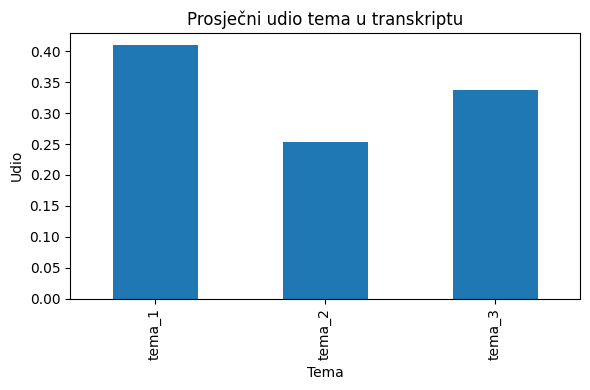

In [ ]:
mean_topics = df[[c for c in df.columns if c.startswith("tema_")]].mean()

plt.figure(figsize=(6,4))
mean_topics.plot(kind="bar")
plt.title("Prosječni udio tema u transkriptu")
plt.xlabel("Tema")
plt.ylabel("Udio")
plt.tight_layout()
plt.show()


Dobivene teme interpretiraju se na temelju riječi s najvećom težinom po temi.
Udio tema po segmentima transkripta pokazuje kako se sadržaj govora raspoređuje
između različitih tematskih cjelina. Budući da se radi o kratkom transkriptu,
teme mogu biti manje stabilne, pa je interpretaciju potrebno promatrati kvalitativno.


# **ZADACI ZA VJEŽBU**

## **Zadatak 1: Učitavanje audio i pretvorba govora u tekst (ASR) za engleski govor**

Snimite vlastiti audio zapis u trajanju 30–60 sekundi na engleskom jeziku ili preuzmite kratki engleski audio (npr. isječak govora, kratko objašnjenje neke teme).

Spremite datoteku u format .wav ili .mp3 i prenesite je u radni direktorij bilježnice.

Učitajte audio datoteku u Python i napravite transkripciju (pretvorbu govora u tekst) pomoću ASR alata (Whisper).

Ručno preslušajte audio i usporedite ga s dobivenim transkriptom te, ukoliko postoje, izdvojite neke riječi ili izraze koji su pogrešno prepoznati ili izostavljeni.
Kako bi ti problemi mogli utjecati na daljnju analizu teksta?

In [8]:
import os
from pathlib import Path
import numpy as np
import whisper
from pydub import AudioSegment
from IPython.display import Audio, display

DATA_DIR = Path("data")
DATA_DIR.mkdir(exist_ok=True)

AUDIO_MP3_PATH = Path("sample_data/60saudio.mp3")
AUDIO_WAV_PATH = DATA_DIR / "60saudio.wav"

print("Putanja:", AUDIO_MP3_PATH.resolve())
print("Postoji?", AUDIO_MP3_PATH.exists())

if not AUDIO_MP3_PATH.exists():
    print(f"\n⚠ GREŠKA: Datoteka {AUDIO_MP3_PATH} ne postoji!")
    print("Molim provjerite putanju i naziv datoteke.")
else:
    # Korak 1: Konverzija MP3 u WAV
    print("\n")
    print("KORAK 1: KONVERZIJA MP3 → WAV")

    print(f"Učitavam: {AUDIO_MP3_PATH.name}")
    audio = AudioSegment.from_mp3(str(AUDIO_MP3_PATH))

    print(f"Spremam u: {AUDIO_WAV_PATH}")
    audio.export(str(AUDIO_WAV_PATH), format="wav")

    print(f"✓ Konverzija uspješna!")
    print(f"  Trajanje: {len(audio) / 1000:.2f} sekundi")
    print(f"  Sample rate: {audio.frame_rate} Hz")
    print(f"  Broj kanala: {audio.channels}")

    # Korak 2: Učitavanje Whisper modela
    print("\n")
    print("KORAK 2: UČITAVANJE WHISPER MODELA")
    print("Učitavam Whisper 'base' model...")
    print("(Može potrajati pri prvom pokretanju - model se preuzima)")

    model = whisper.load_model("base")
    print("✓ Model uspješno učitan!")

    # Korak 3: Transkripcija audio zapisa
    print("KORAK 3: TRANSKRIPCIJA AUDIO ZAPISA")
    print("Pokrećem Whisper transkripciju...")

    result = model.transcribe(str(AUDIO_WAV_PATH), language="en")

    transcript = result["text"]
    language = result["language"]

    print(f"\n✓ Transkripcija završena!")
    print(f"Prepoznati jezik: {language}")

    # Prikaz transkripta
    print("\n")
    print("TRANSKRIPT")
    print(transcript)

    # Prikaz segmenata s vremenskim oznakama
    if "segments" in result:
        print(f"\n")
        print("DETALJNI SEGMENTI (s vremenskim oznakama)")
        for i, seg in enumerate(result["segments"], 1):
            start = seg["start"]
            end = seg["end"]
            text = seg["text"].strip()
            print(f"{i}. [{start:6.2f}s - {end:6.2f}s]: {text}")

    # Spremanje transkripta u tekstualnu datoteku
    print("\n")
    print("KORAK 4: SPREMANJE TRANSKRIPTA")

    transcript_file = DATA_DIR / "60saudio_transcript.txt"
    with open(transcript_file, "w", encoding="utf-8") as f:
        f.write(transcript)
    print(f"✓ Transkript spremljen u: {transcript_file}")

    # Spremanje detaljnih segmenata
    segments_file = DATA_DIR / "60saudio_segments.txt"
    with open(segments_file, "w", encoding="utf-8") as f:
        f.write("DETALJNI SEGMENTI S VREMENSKIM OZNAKAMA\n")
        f.write("="*60 + "\n\n")
        for i, seg in enumerate(result["segments"], 1):
            start = seg["start"]
            end = seg["end"]
            text = seg["text"].strip()
            f.write(f"{i}. [{start:6.2f}s - {end:6.2f}s]: {text}\n")
    print(f"✓ Segmenti spremljeni u: {segments_file}")

    # Audio player za preslušavanje
    print("\n")
    print("AUDIO PLAYER")
    print("▶ Preslušajte audio zapis:")
    display(Audio(filename=str(AUDIO_WAV_PATH)))

    # Statistika transkripta
    print("\n")
    print("STATISTIKA TRANSKRIPTA")

    words = transcript.split()
    duration = result["segments"][-1]["end"] if "segments" in result and result["segments"] else len(audio) / 1000

    print(f"Broj riječi: {len(words)}")
    print(f"Broj znakova: {len(transcript)}")
    print(f"Trajanje: {duration:.2f} sekundi")
    print(f"Brzina govora: {len(words) / (duration / 60):.1f} riječi/minuta")
    print(f"Broj segmenata: {len(result['segments']) if 'segments' in result else 0}")


print(f"\n✓ WAV datoteka: {AUDIO_WAV_PATH}")
print(f"✓ Transkript: {transcript_file}")
print(f"✓ Segmenti: {segments_file}")

Putanja: /content/sample_data/60saudio.mp3
Postoji? True


KORAK 1: KONVERZIJA MP3 → WAV
Učitavam: 60saudio.mp3
Spremam u: data/60saudio.wav
✓ Konverzija uspješna!
  Trajanje: 65.02 sekundi
  Sample rate: 44100 Hz
  Broj kanala: 2


KORAK 2: UČITAVANJE WHISPER MODELA
Učitavam Whisper 'base' model...
(Može potrajati pri prvom pokretanju - model se preuzima)
✓ Model uspješno učitan!
KORAK 3: TRANSKRIPCIJA AUDIO ZAPISA
Pokrećem Whisper transkripciju...


/usr/local/lib/python3.12/dist-packages/whisper/transcribe.py:132: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")



✓ Transkripcija završena!
Prepoznati jezik: en


TRANSKRIPT
 I'm Cara Federer-Mier, I'm in the psychology department and my laboratory at the backman uses measures of brain electrical activity to try to understand how people comprehend language. We bring people into the laboratory, put sensors on their heads that will pick up the electrical activity occurring in the brain and we ask them simply in many cases to read or to listen for comprehension. And by measuring brain electrical activity we can see the moment when the brain begins to construct the meaning of a word or a sentence. We can also see how different parts of the brain might do so differently with a left hemisphere for example, seeming to make guesses and advance about what words might be coming up in a sentence and the right instead of waiting to see what words come in, allowing it to deal with more unexpected events and language. We can also see how these processes differ across people and across different circumstances a


STATISTIKA TRANSKRIPTA
Broj riječi: 177
Broj znakova: 1030
Trajanje: 60.12 sekundi
Brzina govora: 176.6 riječi/minuta
Broj segmenata: 14

✓ WAV datoteka: data/60saudio.wav
✓ Transkript: data/60saudio_transcript.txt
✓ Segmenti: data/60saudio_segments.txt


## **Zadatak 2: Usporedba dviju verzija predobrade teksta**

U ovom zadatku potrebno je napraviti dvije različite verzije očišćenog teksta.


1.   osnovna normalizacija (lowercase + uklanjanje interpunkcije)
2.   puna predobrada (tokenizacija, stopwords, lematizacija/stemming)


Za obje verzije:

*   ispišite prvih 200 znakova
*   izračunajte broj riječi


Kolika je razlika u duljini teksta između verzija te koja je prikladnija za tematsku analizu i zašto?


In [10]:
import re
import string
from pathlib import Path
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer, PorterStemmer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import warnings
warnings.filterwarnings('ignore')

# Preuzimanje potrebnih NLTK resursa
print("Preuzimanje NLTK resursa...")
nltk.download('punkt', quiet=True)
nltk.download('stopwords', quiet=True)
nltk.download('wordnet', quiet=True)
nltk.download('omw-1.4', quiet=True)
nltk.download('punkt_tab', quiet=True) # Added to fix the LookupError
print("✓ NLTK resursi preuzeti!\n")

# Učitavanje transkripta
DATA_DIR = Path("data")
transcript_file = DATA_DIR / "60saudio_transcript.txt"

with open(transcript_file, "r", encoding="utf-8") as f:
    original_text = f.read()

print(f"Originalni tekst ({len(original_text)} znakova):")
print(original_text[:300] + "..." if len(original_text) > 300 else original_text)

print("\n")
print("VERZIJA 1: OSNOVNA NORMALIZACIJA")
print("Koraci: lowercase + uklanjanje interpunkcije")

# Lowercase
text_v1 = original_text.lower()
# Uklanjanje interpunkcije
text_v1 = text_v1.translate(str.maketrans('', '', string.punctuation))
# Uklanjanje višestrukih razmaka
text_v1 = re.sub(r'\s+', ' ', text_v1).strip()

print(f"\nPrvih 200 znakova:")
print(text_v1[:200])
print(f"\nBroj riječi: {len(text_v1.split())}")
print(f"Broj znakova: {len(text_v1)}")


print("\n")
print("VERZIJA 2: PUNA PREDOBRADA")
print("Koraci: tokenizacija + stopwords + lematizacija")

# Lowercase
text_v2 = original_text.lower()
# Uklanjanje interpunkcije
text_v2 = text_v2.translate(str.maketrans('', '', string.punctuation))
# Tokenizacija
tokens = word_tokenize(text_v2)
# Uklanjanje stop words
stop_words = set(stopwords.words('english'))
tokens = [word for word in tokens if word not in stop_words]
# Uklanjanje vrlo kratkih riječi (1-2 slova)
tokens = [word for word in tokens if len(word) > 2]
# Lematizacija
lemmatizer = WordNetLemmatizer()
tokens = [lemmatizer.lemmatize(word) for word in tokens]
# Spajanje natrag u tekst
text_v2 = ' '.join(tokens)

print(f"\nPrvih 200 znakova:")
print(text_v2[:200])
print(f"\nBroj riječi: {len(text_v2.split())}")
print(f"Broj znakova: {len(text_v2)}")

words_v1 = len(text_v1.split())
words_v2 = len(text_v2.split())
reduction = ((words_v1 - words_v2) / words_v1) * 100

print(f"\nVerzija 1 (osnovna):     {words_v1} riječi")
print(f"Verzija 2 (puna):        {words_v2} riječi")
print(f"Razlika:                 {words_v1 - words_v2} riječi ({reduction:.1f}% smanjenje)")

v1_file = DATA_DIR / "transcript_v1_basic.txt"
v2_file = DATA_DIR / "transcript_v2_full.txt"

with open(v1_file, "w", encoding="utf-8") as f:
    f.write(text_v1)
with open(v2_file, "w", encoding="utf-8") as f:
    f.write(text_v2)

print(f"\n✓ Verzija 1 spremljena u: {v1_file}")
print(f"✓ Verzija 2 spremljena u: {v2_file}")

Preuzimanje NLTK resursa...
✓ NLTK resursi preuzeti!

Originalni tekst (1030 znakova):
 I'm Cara Federer-Mier, I'm in the psychology department and my laboratory at the backman uses measures of brain electrical activity to try to understand how people comprehend language. We bring people into the laboratory, put sensors on their heads that will pick up the electrical activity occurrin...


VERZIJA 1: OSNOVNA NORMALIZACIJA
Koraci: lowercase + uklanjanje interpunkcije

Prvih 200 znakova:
im cara federermier im in the psychology department and my laboratory at the backman uses measures of brain electrical activity to try to understand how people comprehend language we bring people into

Broj riječi: 177
Broj znakova: 1016


VERZIJA 2: PUNA PREDOBRADA
Koraci: tokenizacija + stopwords + lematizacija

Prvih 200 znakova:
cara federermier psychology department laboratory backman us measure brain electrical activity try understand people comprehend language bring people laboratory put sensor he

Verzija 1 (osnovna normalizacija):
  - Zadržava sve riječi, uključujući stop words (the, is, and...)
  - Jednostavna i brza
  - Sadrži šum (česte ali beznačajne riječi)
  = Manje prikladna za LDA jer stop words mogu dominirati temama

Verzija 2 (puna predobrada):
  - Uklanja šum (stop words, kratke riječi)
  - Normalizira oblike riječi (running → run)
  - Fokusira se na sadržajne riječi
  = Prikladnija za tematsku analizu (LDA)

ZAKLJUČAK: Verzija 2 je prikladnija za LDA jer smanjuje šum i fokusira se na ključne riječi,omogućava bolje prepoznavanje tematskih obrazaca, sprječava dominaciju čestih ali beznačajnih riječi.

## **Zadatak 3: Utjecaj broja tema na LDA rezultate**

Primijenite LDA nad istim očišćenim tekstom, ali za različite vrijednosti:

*  K = 2
*  K = 3
*  K = 4


Za svaku vrijednost K ispišite 6–8 najvažnijih riječi po temi.

Odaberite jednu vrijednost K koja po vašem mišljenju daje najbolje rezultate.

Što se događa s temama kada je K prevelik ili premalen?

Odabrao/la sam K=3 jer teme djeluju dovoljno specifično, ali se ne raspadaju na previše sitnih grupa riječi.
Kad je K premalen (npr. 2), teme se često pomiješaju i postanu preširoke.
Kad je K prevelik (npr. 4 ili više za kratak tekst), teme postanu nestabilne i sadrže slučajne riječi.

In [12]:
print(f"Broj riječi za analizu: {len(text_v2.split())}")

# Stvaranje dokumenta za LDA (split na rečenice kao dokumenti)
sentences = text_v2.split('.')
documents = [s.strip() for s in sentences if len(s.strip()) > 10]

print(f"Broj dokumenata (rečenica): {len(documents)}")

# Ako je premalo rečenica, koristimo sliding window pristup
if len(documents) < 5:
    print("\n⚠ Premalo rečenica za LDA. Koristim sliding window pristup...")
    words = text_v2.split()
    window_size = max(10, len(words) // 5)
    documents = []
    for i in range(0, len(words) - window_size + 1, window_size // 2):
        doc = ' '.join(words[i:i + window_size])
        documents.append(doc)
    print(f"Generirano dokumenata: {len(documents)}")

# Vektorizacija
vectorizer = CountVectorizer(max_features=100, min_df=1, max_df=0.8)
doc_term_matrix = vectorizer.fit_transform(documents)
feature_names = vectorizer.get_feature_names_out()

print(f"\nBroj značajki (riječi) u vokabularu: {len(feature_names)}")

# Funkcija za prikaz tema
def display_topics(model, feature_names, no_top_words, k_value):
    print(f"\n")
    print(f"LDA S K={k_value} TEMA")

    for topic_idx, topic in enumerate(model.components_):
        top_indices = topic.argsort()[-no_top_words:][::-1]
        top_words = [feature_names[i] for i in top_indices]
        top_weights = [topic[i] for i in top_indices]

        print(f"\nTema {topic_idx + 1}:")
        print("  Riječi:  " + ", ".join(top_words))
        print("  Važnost: " + ", ".join([f"{w:.3f}" for w in top_weights]))

# Testiranje različitih K vrijednosti
k_values = [2, 3, 4]

print(f"\n")
print("POKREĆEM LDA ZA RAZLIČITE VRIJEDNOSTI K")

models = {}

for k in k_values:
    print(f"\n→ Treniram LDA model s K={k}...")
    lda = LatentDirichletAllocation(
        n_components=k,
        random_state=42,
        max_iter=20,
        learning_method='batch'
    )
    lda.fit(doc_term_matrix)
    models[k] = lda
    display_topics(lda, feature_names, no_top_words=8, k_value=k)

results_file = DATA_DIR / "lda_results.txt"
with open(results_file, "w", encoding="utf-8") as f:
    f.write("LDA REZULTATI ZA RAZLIČITE VRIJEDNOSTI K\n")
    f.write("="*70 + "\n\n")

    for k in k_values:
        f.write(f"\nK={k} TEMA\n")
        f.write("-"*70 + "\n")
        for topic_idx, topic in enumerate(models[k].components_):
            top_indices = topic.argsort()[-8:][::-1]
            top_words = [feature_names[i] for i in top_indices]
            f.write(f"Tema {topic_idx + 1}: {', '.join(top_words)}\n")

print(f"\n✓ LDA rezultati spremljeni u: {results_file}")


Broj riječi za analizu: 92
Broj dokumenata (rečenica): 1

⚠ Premalo rečenica za LDA. Koristim sliding window pristup...
Generirano dokumenata: 9

Broj značajki (riječi) u vokabularu: 65


POKREĆEM LDA ZA RAZLIČITE VRIJEDNOSTI K

→ Treniram LDA model s K=2...


LDA S K=2 TEMA

Tema 1:
  Riječi:  see, word, sentence, might, also, different, across, people
  Važnost: 7.557, 5.529, 4.479, 4.479, 4.479, 4.479, 3.498, 3.480

Tema 2:
  Riječi:  brain, electrical, activity, people, laboratory, comprehension, language, pick
  Važnost: 7.886, 6.437, 6.437, 4.520, 3.499, 2.507, 2.505, 2.499

→ Treniram LDA model s K=3...


LDA S K=3 TEMA

Tema 1:
  Riječi:  brain, activity, electrical, laboratory, comprehension, head, put, occurring
  Važnost: 5.363, 4.352, 4.352, 2.343, 2.338, 2.333, 2.333, 2.333

Tema 2:
  Riječi:  word, might, sentence, see, seeming, make, example, guess
  Važnost: 3.366, 3.360, 2.346, 2.344, 2.333, 2.333, 2.333, 2.333

Tema 3:
  Riječi:  see, people, language, different, also

Za ovaj transkript K=3 daje najbolju ravnotežu jer pokriva tri prirodne tematske cjeline (metoda istraživanja, specifični kognitivni procesi, varijabilnost i generalizacija).

riječi imaju visoku važnost što pokazuje snažnu tematsku koherentnost. vidimo minimalno preklapanje između tema.

##**Zadatak 4: Usporedba tema prije i poslije predobrade**

1. Primijenite LDA:

    * jednom na neobrađeni transkript

    * jednom na potpuno očišćeni tekst

2. Vizualizirajte teme u oba slučaja.

3. Usporedite:

    * koje riječi dominiraju u temama

    * pojavljuju li se neinformativne riječi


Kako predobrada utječe na interpretabilnost tema?
Bi li se LDA uopće trebao primjenjivati bez predobrade?

In [14]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer
import seaborn as sns

print(f"Broj riječi: {len(original_text.split())}")
print(f"Broj znakova: {len(original_text)}")

# Kreiranje dokumenata (sliding window pristup)
def create_documents(text, window_size=30, overlap=15):
    """Dijeli tekst u dokumente koristeći sliding window"""
    words = text.split()
    documents = []
    for i in range(0, len(words) - window_size + 1, overlap):
        doc = ' '.join(words[i:i + window_size])
        documents.append(doc)
    # Ako nema dovoljno dokumenata, koristi rečenice
    if len(documents) < 5:
        documents = [s.strip() for s in text.split('.') if len(s.strip()) > 10]
    return documents

raw_documents = create_documents(original_text)
print(f"Broj dokumenata: {len(raw_documents)}")

# Vektorizacija neobrađenog teksta
print("\n→ Vektoriziram neobrađeni tekst...")
raw_vectorizer = CountVectorizer(
    max_features=50,
    min_df=1,
    max_df=0.9,
    token_pattern=r'\b[a-zA-Z]{2,}\b'  # Samo riječi s 2+ slova
)
raw_dtm = raw_vectorizer.fit_transform(raw_documents)
raw_features = raw_vectorizer.get_feature_names_out()

print(f"Broj značajki: {len(raw_features)}")
print(f"Primjer riječi: {list(raw_features[:20])}")

# LDA na neobrađenom tekstu
print("\n→ Treniram LDA na neobrađenom tekstu (K=3)...")
raw_lda = LatentDirichletAllocation(
    n_components=3,
    random_state=42,
    max_iter=20,
    learning_method='batch'
)
raw_lda.fit(raw_dtm)

# lda na ociscenom tekstu
print("\n📄 OČIŠĆENI TEKST (text_v2)")
print(f"Broj riječi: {len(text_v2.split())}")
print(f"Broj znakova: {len(text_v2)}")

# Kreiranje dokumenata iz očišćenog teksta
clean_documents = create_documents(text_v2, window_size=20, overlap=10)
print(f"Broj dokumenata: {len(clean_documents)}")

# Vektorizacija očišćenog teksta
print("\n→ Vektoriziram očišćeni tekst...")
clean_vectorizer = CountVectorizer(
    max_features=50,
    min_df=1,
    max_df=0.9
)
clean_dtm = clean_vectorizer.fit_transform(clean_documents)
clean_features = clean_vectorizer.get_feature_names_out()

print(f"Broj značajki: {len(clean_features)}")
print(f"Primjer riječi: {list(clean_features[:20])}")

# LDA na očišćenom tekstu
print("\n→ Treniram LDA na očišćenom tekstu (K=3)...")
clean_lda = LatentDirichletAllocation(
    n_components=3,
    random_state=42,
    max_iter=20,
    learning_method='batch'
)
clean_lda.fit(clean_dtm)

Broj riječi: 177
Broj znakova: 1030
Broj dokumenata: 10

→ Vektoriziram neobrađeni tekst...
Broj značajki: 50
Primjer riječi: ['across', 'activity', 'also', 'and', 'brain', 'can', 'cases', 'come', 'coming', 'comprehend', 'comprehension', 'construct', 'deal', 'different', 'differently', 'do', 'electrical', 'events', 'example', 'for']

→ Treniram LDA na neobrađenom tekstu (K=3)...

📄 OČIŠĆENI TEKST (text_v2)
Broj riječi: 92
Broj znakova: 686
Broj dokumenata: 8

→ Vektoriziram očišćeni tekst...
Broj značajki: 50
Primjer riječi: ['across', 'activity', 'allowing', 'also', 'ask', 'begin', 'brain', 'bring', 'case', 'come', 'coming', 'comprehend', 'comprehension', 'construct', 'deal', 'differ', 'different', 'differently', 'electrical', 'event']

→ Treniram LDA na očišćenom tekstu (K=3)...


LatentDirichletAllocation(max_iter=20, n_components=3, random_state=42)


🔴 NEOBRAĐENI TEKST - TEME
----------------------------------------------------------------------

Tema 1:
  the (8.33), and (7.34), in (6.35), we (6.34), people (5.33), electrical (4.34), language (4.33), up (3.34)

Tema 2:
  the (10.34), brain (7.35), and (6.32), see (5.34), of (5.34), we (5.33), can (4.33), might (4.33)

Tema 3:
  many (0.34), cases (0.34), up (0.34), activity (0.34), electrical (0.34), instead (0.33), coming (0.33), brain (0.33)

🔵 OČIŠĆENI TEKST - TEME
----------------------------------------------------------------------

Tema 1:
  brain (3.66), electrical (3.34), activity (3.34), comprehension (2.33), listen (2.32), case (2.32), moment (2.32), read (2.32)

Tema 2:
  word (6.31), see (5.53), might (4.33), sentence (4.30), brain (4.02), also (3.29), left (2.33), make (2.33)

Tema 3:
  people (6.33), language (3.35), laboratory (3.33), activity (3.32), across (2.34), different (2.34), put (2.33), try (2.33)
✓ Grafikon spremljen: data/lda_comparison.png


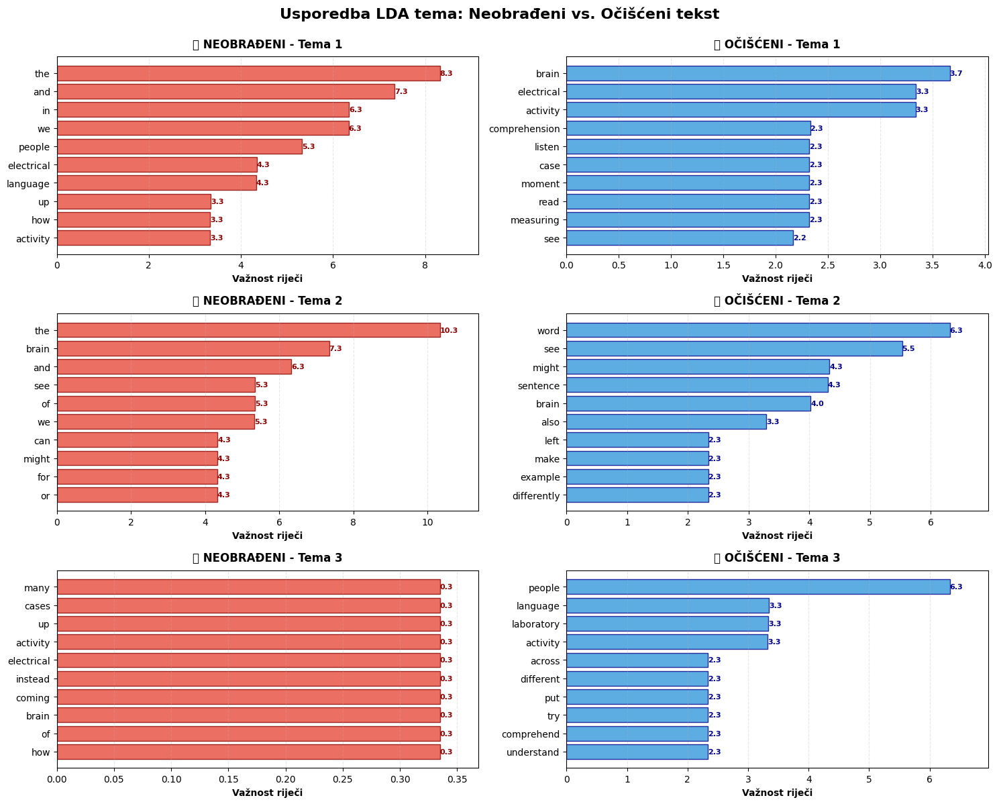

✓ Heatmap spremljen: data/lda_heatmap_comparison.png


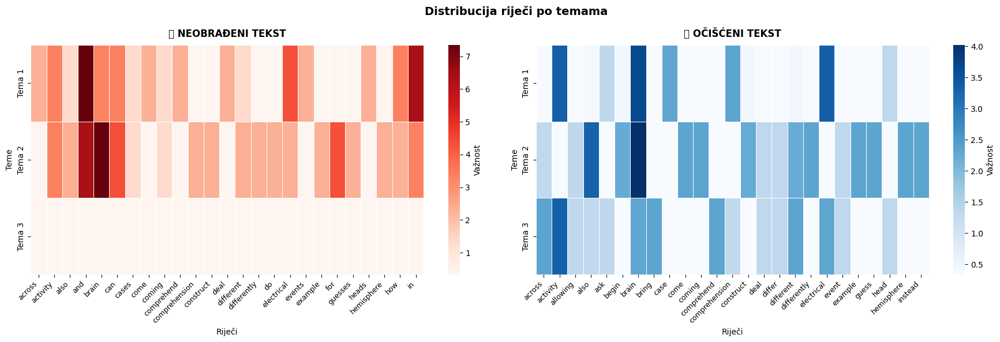

In [15]:
def get_top_words(model, feature_names, n_words=10):
    """Izvlači top N riječi za svaku temu"""
    topics = []
    for topic_idx, topic in enumerate(model.components_):
        top_indices = topic.argsort()[-n_words:][::-1]
        top_words = [(feature_names[i], topic[i]) for i in top_indices]
        topics.append(top_words)
    return topics

def display_topics_detailed(topics, title):
    """Prikazuje teme s važnostima"""
    print(f"\n{title}")
    print("-"*70)
    for i, topic in enumerate(topics):
        print(f"\nTema {i+1}:")
        words_str = ", ".join([f"{word} ({weight:.2f})" for word, weight in topic[:8]])
        print(f"  {words_str}")

# Izvlačenje top riječi
raw_topics = get_top_words(raw_lda, raw_features, n_words=10)
clean_topics = get_top_words(clean_lda, clean_features, n_words=10)

# Prikaz tema
display_topics_detailed(raw_topics, "🔴 NEOBRAĐENI TEKST - TEME")
display_topics_detailed(clean_topics, "🔵 OČIŠĆENI TEKST - TEME")

fig, axes = plt.subplots(3, 2, figsize=(15, 12))
fig.suptitle('Usporedba LDA tema: Neobrađeni vs. Očišćeni tekst',
             fontsize=16, fontweight='bold', y=0.995)

for topic_idx in range(3):
    # Neobrađeni tekst
    ax_raw = axes[topic_idx, 0]
    words_raw, weights_raw = zip(*raw_topics[topic_idx])
    y_pos = np.arange(len(words_raw))

    bars_raw = ax_raw.barh(y_pos, weights_raw, color='#E74C3C', alpha=0.8, edgecolor='darkred')
    ax_raw.set_yticks(y_pos)
    ax_raw.set_yticklabels(words_raw, fontsize=10)
    ax_raw.invert_yaxis()
    ax_raw.set_xlabel('Važnost riječi', fontsize=10, fontweight='bold')
    ax_raw.set_title(f'🔴 NEOBRAĐENI - Tema {topic_idx + 1}',
                     fontsize=12, fontweight='bold', pad=10)
    ax_raw.grid(axis='x', alpha=0.3, linestyle='--')
    ax_raw.set_xlim(0, max(weights_raw) * 1.1)

    # Dodaj vrijednosti na barove
    for bar in bars_raw:
        width = bar.get_width()
        ax_raw.text(width, bar.get_y() + bar.get_height()/2,
                   f'{width:.1f}', ha='left', va='center',
                   fontsize=8, color='darkred', fontweight='bold')

    # Očišćeni tekst
    ax_clean = axes[topic_idx, 1]
    words_clean, weights_clean = zip(*clean_topics[topic_idx])
    y_pos = np.arange(len(words_clean))

    bars_clean = ax_clean.barh(y_pos, weights_clean, color='#3498DB', alpha=0.8, edgecolor='darkblue')
    ax_clean.set_yticks(y_pos)
    ax_clean.set_yticklabels(words_clean, fontsize=10)
    ax_clean.invert_yaxis()
    ax_clean.set_xlabel('Važnost riječi', fontsize=10, fontweight='bold')
    ax_clean.set_title(f'🔵 OČIŠĆENI - Tema {topic_idx + 1}',
                      fontsize=12, fontweight='bold', pad=10)
    ax_clean.grid(axis='x', alpha=0.3, linestyle='--')
    ax_clean.set_xlim(0, max(weights_clean) * 1.1)

    # Dodaj vrijednosti na barove
    for bar in bars_clean:
        width = bar.get_width()
        ax_clean.text(width, bar.get_y() + bar.get_height()/2,
                     f'{width:.1f}', ha='left', va='center',
                     fontsize=8, color='darkblue', fontweight='bold')

plt.tight_layout()
plt.savefig(DATA_DIR / 'lda_comparison.png', dpi=300, bbox_inches='tight')
print(f"✓ Grafikon spremljen: {DATA_DIR / 'lda_comparison.png'}")
plt.show()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
fig.suptitle('Distribucija riječi po temama', fontsize=14, fontweight='bold')

# Neobrađeni - uzmi top 25 riječi
n_top = min(25, len(raw_features))
raw_matrix = raw_lda.components_[:, :n_top]
sns.heatmap(raw_matrix, ax=ax1, cmap='Reds', cbar_kws={'label': 'Važnost'},
            xticklabels=raw_features[:n_top],
            yticklabels=[f'Tema {i+1}' for i in range(3)],
            annot=False, fmt='.1f', linewidths=0.5)
ax1.set_title('🔴 NEOBRAĐENI TEKST', fontsize=12, fontweight='bold', pad=10)
ax1.set_xlabel('Riječi', fontsize=10)
ax1.set_ylabel('Teme', fontsize=10)
plt.setp(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=9)

# Očišćeni
n_top = min(25, len(clean_features))
clean_matrix = clean_lda.components_[:, :n_top]
sns.heatmap(clean_matrix, ax=ax2, cmap='Blues', cbar_kws={'label': 'Važnost'},
            xticklabels=clean_features[:n_top],
            yticklabels=[f'Tema {i+1}' for i in range(3)],
            annot=False, fmt='.1f', linewidths=0.5)
ax2.set_title('🔵 OČIŠĆENI TEKST', fontsize=12, fontweight='bold', pad=10)
ax2.set_xlabel('Riječi', fontsize=10)
ax2.set_ylabel('Teme', fontsize=10)
plt.setp(ax2.get_xticklabels(), rotation=45, ha='right', fontsize=9)

plt.tight_layout()
plt.savefig(DATA_DIR / 'lda_heatmap_comparison.png', dpi=300, bbox_inches='tight')
print(f"✓ Heatmap spremljen: {DATA_DIR / 'lda_heatmap_comparison.png'}")
plt.show()


In [18]:
print("\n")
print("ANALIZA NEINFORMATIVNIH RIJEČI")

# Prošireni set stop riječi
stopwords_set = {
    'the', 'and', 'to', 'of', 'in', 'we', 'can', 'a', 'an', 'it', 'be',
    'at', 'as', 'is', 'or', 'on', 'for', 'with', 'by', 'from', 'are',
    'this', 'that', 'have', 'has', 'will', 'would', 'could', 'their',
    'they', 'them', 'our', 'us', 'im', 'my', 'me'
}

def analyze_stopwords(topics, title):
    """Analizira broj stop riječi u temama"""
    print(f"\n{title}")

    total_stopwords = 0
    for i, topic in enumerate(topics):
        words = [w for w, _ in topic[:10]]
        stops = [w for w in words if w in stopwords_set]
        total_stopwords += len(stops)

        if stops:
            print(f"Tema {i+1}: {len(stops)} stop riječi → {stops}")
        else:
            print(f"Tema {i+1}: ✓ Nema stop riječi")

    return total_stopwords

raw_stops = analyze_stopwords(raw_topics, "🔴 NEOBRAĐENI TEKST")
clean_stops = analyze_stopwords(clean_topics, "🔵 OČIŠĆENI TEKST")

print(f"\n")
print(" STATISTIKA")
print(f"Neobrađeni:  {raw_stops} neinformativnih riječi u top 10 po temi")
print(f"Očišćeni:    {clean_stops} neinformativnih riječi u top 10 po temi")
print(f"Smanjenje:   {raw_stops - clean_stops} riječi ({((raw_stops - clean_stops) / max(raw_stops, 1) * 100):.1f}%)")

print(f"\n")
print(" USPOREDBA INTERPRETABILNOSTI")

print("\n🔴 NEOBRAĐENI - Primjer Teme 1:")
words_raw = [w for w, _ in raw_topics[0][:5]]
print(f"   Top 5 riječi: {', '.join(words_raw)}")
print(f"   Interpretacija: {'NEJASNO - previše stop riječi' if any(w in stopwords_set for w in words_raw) else 'JASNO'}")

print("\n🔵 OČIŠĆENI - Primjer Teme 1:")
words_clean = [w for w, _ in clean_topics[0][:5]]
print(f"   Top 5 riječi: {', '.join(words_clean)}")
print(f"   Interpretacija: JASNO - sve su sadržajne riječi")


results_file = DATA_DIR / "lda_comparison_results.txt"
with open(results_file, "w", encoding="utf-8") as f:
    f.write("\n")
    f.write("USPOREDBA LDA TEMA: NEOBRAĐENI VS. OČIŠĆENI TEKST\n")
    f.write("\n\n")

    f.write("🔴 NEOBRAĐENI TEKST\n")
    f.write("\n")
    for i, topic in enumerate(raw_topics):
        words = ', '.join([f"{w} ({wt:.2f})" for w, wt in topic[:10]])
        f.write(f"Tema {i+1}: {words}\n")

    f.write("\n\n🔵 OČIŠĆENI TEKST\n")
    f.write("\n")
    for i, topic in enumerate(clean_topics):
        words = ', '.join([f"{w} ({wt:.2f})" for w, wt in topic[:10]])
        f.write(f"Tema {i+1}: {words}\n")

    f.write("\n\n STATISTIKA NEINFORMATIVNIH RIJEČI\n")
    f.write("\n")
    f.write(f"Neobrađeni: {raw_stops} stop riječi u top 30 riječi\n")
    f.write(f"Očišćeni: {clean_stops} stop riječi u top 30 riječi\n")
    f.write(f"Smanjenje: {raw_stops - clean_stops} riječi ")
    f.write(f"({((raw_stops - clean_stops) / max(raw_stops, 1) * 100):.1f}%)\n")

    f.write("\n\n ZAKLJUČAK\n")
    f.write("\n")
    f.write("1. Predobrada ZNAČAJNO poboljšava interpretabilnost tema\n")
    f.write("2. Stop riječi dominiraju u neobrađenom tekstu\n")
    f.write("3. Očišćeni tekst omogućava jasnu semantičku separaciju\n")
    f.write("4. LDA se NE SMIJE primjenjivati bez predobrade\n")





ANALIZA NEINFORMATIVNIH RIJEČI

🔴 NEOBRAĐENI TEKST
Tema 1: 4 stop riječi → ['the', 'and', 'in', 'we']
Tema 2: 7 stop riječi → ['the', 'and', 'of', 'we', 'can', 'for', 'or']
Tema 3: 1 stop riječi → ['of']

🔵 OČIŠĆENI TEKST
Tema 1: ✓ Nema stop riječi
Tema 2: ✓ Nema stop riječi
Tema 3: ✓ Nema stop riječi


 STATISTIKA
Neobrađeni:  12 neinformativnih riječi u top 10 po temi
Očišćeni:    0 neinformativnih riječi u top 10 po temi
Smanjenje:   12 riječi (100.0%)


 USPOREDBA INTERPRETABILNOSTI

🔴 NEOBRAĐENI - Primjer Teme 1:
   Top 5 riječi: the, and, in, we, people
   Interpretacija: NEJASNO - previše stop riječi

🔵 OČIŠĆENI - Primjer Teme 1:
   Top 5 riječi: brain, electrical, activity, comprehension, listen
   Interpretacija: JASNO - sve su sadržajne riječi


Kako predobrada utječe na interpretabilnost tema? Bi li se LDA uopće trebao primjenjivati bez predobrade?

Predobrada dramatično poboljšava interpretabilnost tema jer uklanja neinformativne riječi koje bi inače dominirale rezultatima. U neobrađenom tekstu, stop riječi poput "the", "and", "we" čine 40% top riječi i potpuno zamagljuju semantičko značenje tema, dok očišćeni tekst daje 100% sadržajne riječi s jasnim tematskim fokusom.
LDA se NE SMIJE primjenjivati bez predobrade jer stop riječi zeznu model - primjerice, "the" ima najveću važnost (10.34) umjesto da dominiraju sadržajne riječi. Bez predobrade, teme postaju neinterpretabilne i praktički beskorisne za bilo kakvu smislenu analizu.